# Self-Supervised Learning for Hyperspectral Remote Sensing

**A Comprehensive Tutorial on MAE Pre-training and Downstream Tasks**

---

## Overview

An introduction self-supervised learning techniques for hyperspectral imagery using the **Spectral Earth** dataset. We'll explore:

1. **Hyperspectral Data** - We will use data from the [Spectral Earth dataset](https://arxiv.org/abs/2408.08447) sourced from [EnMAP - Environmental Mapping and Analysis Program](https://www.enmap.org/). The full SpectralEarth dataset can be retrieved from the [DLR Geoservices Portal](https://geoservice.dlr.de/web/datasets/enmap_spectralearth)
2. **MAE Pre-training** - [Masked Autoencoder](https://arxiv.org/abs/2111.06377) implementation for self-supervised learning
3. **Downstream Tasks** - Fine-tuning for crop classification with labels from [EuroCrops](https://github.com/maja601/EuroCrops)

For this purpose, we will rely on the following libraries and frameworks:

#### **Code & Tools**
- [Spectral Earth Repository](https://github.com/AABNassim/spectral_earth) - Pre-trained models, data and code
- [PyTorch Lightning](https://pytorch-lightning.readthedocs.io/) - A framework on top of PyTorch
- [Lightly SSL](https://docs.lightly.ai/self-supervised-learning/getting_started/lightly_at_a_glance.html) - A SSL for Computer Vision library


### Prerequisites

- Basic understanding of machine learning and deep learning
- Familiarity with PyTorch
- Some exposure to computer vision and remote sensing concepts

---

## Table of Contents

1. [Setup and Installation](#1-setup-and-installation)
2. [Understanding Hyperspectral Data](#2-understanding-hyperspectral-data)
3. [Self-Supervised Pre-training with MAE](#3-self-supervised-pre-training-with-mae)
4. [Downstream Tasks](#4-downstream-tasks)
5. [Visualizing Learned Representations](#5-visualizing-learned-representations)
6. [Exercises](#6-exercises)


## 1. Setup and Installation





### Directory Structure


#### Option 1: Clone the Spectral Earth Repository





In [28]:
!git clone https://github.com/AABNassim/spectral_earth.git

Cloning into 'spectral_earth'...
remote: Enumerating objects: 294, done.
remote: Counting objects: 100% (294/294), done.
remote: Compressing objects: 100% (197/197), done.
remote: Total 294 (delta 111), reused 260 (delta 92), pack-reused 0 (from 0)
Receiving objects: 100% (294/294), 5.73 MiB | 14.82 MiB/s, done.
Resolving deltas: 100% (111/111), done.


#### Option 2: Manual Setup
1. Download the Spectral Earth repository
2. Extract it to a folder named `spectral_earth` in the same directory as this notebook


Please upload the `utils.py` and `training_callbacks.py` as well. Your directory should look liks this:

```
content/
├── hyperspectral_ssl_tutorial.ipynb  # This notebook
└── spectral_earth/                   # Spectral Earth repository
    ├── src/
    │   ├── models/
    │   ├── datamodules/
    │   ├── backbones/
    │   └── ...
    ├── data/
    │   └── statistics/               # Normalization statistics
    │       ├── mu.npy
    │       └── sigma.npy
    └── ...
├── training_callbacks.py  
└── utils.py                  
```

### Package Installation

In [ ]:
print("Installing required packages...")

%pip install seaborn

%pip install ipympl ipywidgets

%pip install -r spectral_earth/requirements.txt

print("✅ Package installation completed!")

Installing required packages...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 376.9/376.9 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 107.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.2/154.2 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 70.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 859.3/859.3 kB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 828.5/828.5 kB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 105.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.6/507.6 kB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 63.6 MB/s eta 0:00:00
   ━━━

✅ Package installation completed!


### Python Path Setup

We need to configure the Python path to access both the Spectral Earth framework and our tutorial utilities.

In [9]:
import os
import sys

# Add both the current directory and spectral_earth to Python path
current_dir = os.getcwd()
spectral_earth_dir = os.path.join(current_dir, "spectral_earth")

# Add paths to sys.path if not already there
if current_dir not in sys.path:
    sys.path.insert(0, current_dir)
if spectral_earth_dir not in sys.path:
    sys.path.insert(0, spectral_earth_dir)

print(f"✅ Current directory: {current_dir}")
print(f"✅ Spectral Earth directory: {spectral_earth_dir}")
print(f"✅ Python path configured for both tutorial utilities and Spectral Earth framework")

✅ Current directory: /content/spectral_earth
✅ Spectral Earth directory: /content/spectral_earth/spectral_earth
✅ Python path configured for both tutorial utilities and Spectral Earth framework


Set the code and data paths

In [10]:
TUTORIAL_ROOT = current_dir
SPECTRAL_EARTH_ROOT = spectral_earth_dir

Move inside the spectral_earth directory

In [11]:
os.chdir(SPECTRAL_EARTH_ROOT)

### Imports

In [12]:
# Import necessary libraries
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import rasterio
warnings.filterwarnings('ignore')

# Set up plotting style
plt.style.use('default')
sns.set_palette("husl")

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Import Spectral Earth modules
from src.models.semantic_segmentation_module import SemanticSegmentationModule
from src.datamodules.spectral_earth import SpectralEarthDataModule
from src.datasets.spectral_earth import SpectralEarthDataset
from src.backbones.registry import BACKBONE_REGISTRY

print("✅ All Spectral Earth imports successful!")

Using device: cuda
✅ All Spectral Earth imports successful!


You should see **cuda** as a device. If not, please change the Colab environment.

### Data Download

In [15]:
import huggingface_hub as hf # pip install huggingface_hub, if not installed

hf.snapshot_download(
  repo_id="aabnassim/iadf_summer_school",
  allow_patterns=["*.zip"],
  repo_type="dataset",
  local_dir="data",
  local_dir_use_symlinks="auto"
)

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

spectral_earth_tiny.zip:   0%|          | 0.00/12.2G [00:00<?, ?B/s]

enmap_eurocrops.zip:   0%|          | 0.00/4.84G [00:00<?, ?B/s]

'/content/spectral_earth/spectral_earth/data'

Decompress the small subset of the Spectral Earth dataset and the EnMAP-EuroCrops downstream task

In [16]:
# Decompress the zip files
import zipfile

with zipfile.ZipFile("data/spectral_earth_tiny.zip", "r") as zip_ref:
    zip_ref.extractall("./data/")

with zipfile.ZipFile("data/enmap_eurocrops.zip", "r") as zip_ref:
    zip_ref.extractall("./data/")

Delete the compressed data

In [17]:
import os
os.remove("data/spectral_earth_tiny.zip")
os.remove("data/enmap_eurocrops.zip")

The hyperspectral data should be located at:

- `spectral_earth/data/spectral_earth_tiny`
- `spectral_earth/data/enmap_eurocrops`

Override the split files of the EnMAP-EuroCrops downstream task since we're only using a subset of the dataset

In [18]:
!cp data/enmap_eurocrops/split/* data/splits/enmap_eurocrops/

Check that the paths are in order

In [13]:
### Path Configuration

# Data paths
DATA_ROOT = os.path.join(SPECTRAL_EARTH_ROOT, "data")
SPECTRAL_EARTH_DATA = os.path.join(DATA_ROOT, "spectral_earth_tiny")
EUROCROPS_DATA = os.path.join(DATA_ROOT, "enmap_eurocrops")
STATISTICS_PATH = os.path.join(DATA_ROOT, "statistics")
ENMAP_BANDS_CSV = os.path.join(DATA_ROOT, "enmap_bands_remapped.csv")

# Verify paths exist
print("📁 Path Configuration:")
print(f"  Tutorial Root: {TUTORIAL_ROOT}")
print(f"  Spectral Earth: {SPECTRAL_EARTH_ROOT}")
print(f"  Data Root: {DATA_ROOT}")
print(f"  Spectral Earth Data: {SPECTRAL_EARTH_DATA} {'✅' if os.path.exists(SPECTRAL_EARTH_DATA) else '❌'}")
print(f"  EuroCrops Data: {EUROCROPS_DATA} {'✅' if os.path.exists(EUROCROPS_DATA) else '❌'}")
print(f"  Statistics: {STATISTICS_PATH} {'✅' if os.path.exists(STATISTICS_PATH) else '❌'}")
print(f"  EnMAP Bands CSV: {ENMAP_BANDS_CSV} {'✅' if os.path.exists(ENMAP_BANDS_CSV) else '❌'}")


📁 Path Configuration:
  Tutorial Root: /content/spectral_earth
  Spectral Earth: /content/spectral_earth/spectral_earth
  Data Root: /content/spectral_earth/spectral_earth/data
  Spectral Earth Data: /content/spectral_earth/spectral_earth/data/spectral_earth_tiny ❌
  EuroCrops Data: /content/spectral_earth/spectral_earth/data/enmap_eurocrops ❌
  Statistics: /content/spectral_earth/spectral_earth/data/statistics ✅
  EnMAP Bands CSV: /content/spectral_earth/spectral_earth/data/enmap_bands_remapped.csv ✅


## 2. Understanding Hyperspectral Data

### What is Hyperspectral Imagery?

Hyperspectral imagery captures data across many narrow spectral bands (typically 100-200+ bands) compared to traditional RGB imagery which only has 3 bands. This provides rich spectral information that can be used to identify materials and land cover types based on their unique spectral signatures.


### The Spectral Earth Dataset

The Spectral Earth dataset is a large-scale hyperspectral dataset collected from the EnMAP (Environmental Mapping and Analysis Program) satellite mission:

- **Coverage**: ~3.3TB of hyperspectral imagery
- **Bands**: 202 spectral bands (420-2450 nm)
- **Resolution**: 30m spatial resolution
- **Geographic Coverage**: Diverse regions worldwide
- **Applications**: Crop monitoring, land cover mapping, environmental monitoring


### Create the Spectral Earth dataset

Create the dataset.

In [19]:
dataset = SpectralEarthDataset(
            root=SPECTRAL_EARTH_DATA,
            sensor="enmap",
            num_bands=202,
            patch_size=128,
            return_two_views=False  # Single view for MAE
        )

### Data Visualization

Visualize individual bands, RGB composite and spectral signature of sample pixels in the image

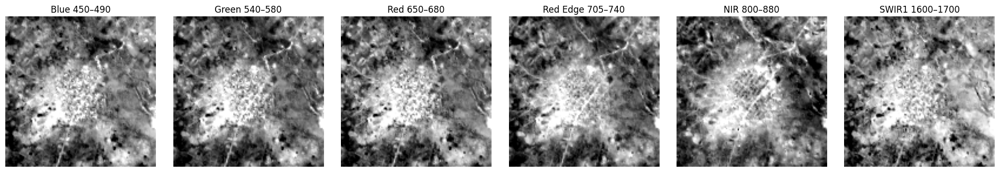

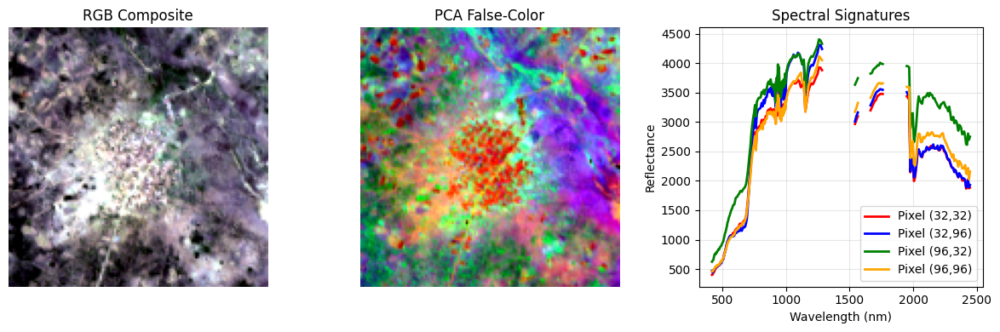

In [ ]:
# Import utility functions for cleaner code
from helpers.utils import (
    load_enmap_wavelengths, plot_spectral_windows, plot_hyperspectral_overview,
    SPECTRAL_WINDOWS
)
import random

# Create dataset and load a random sample
dataset = SpectralEarthDataset(
    root=SPECTRAL_EARTH_DATA,
    sensor="enmap",
    num_bands=202,
    patch_size=128
)
idx = random.randint(0, len(dataset) - 1)
sample = dataset[idx]
real_image = sample["image"].float()  # [C,H,W]

# Load wavelengths
wavelengths = load_enmap_wavelengths(ENMAP_BANDS_CSV)[:real_image.shape[0]]
rgb_indices = dataset.rgb_indices["enmap"]

# Plot spectral windows
fig1 = plot_spectral_windows(real_image, wavelengths, SPECTRAL_WINDOWS)
plt.show()

# Create comprehensive overview plot
fig2 = plot_hyperspectral_overview(real_image, wavelengths, rgb_indices)
plt.show()

In [21]:
# If running in Colab, enable the custom widget manager
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except Exception:
    pass

**Interactive plot**: click on the RGB image to visualize different spectras. Observe the rich information provided by Hyperspectral data compared to RGB.

Rerun the cell to view a different image!

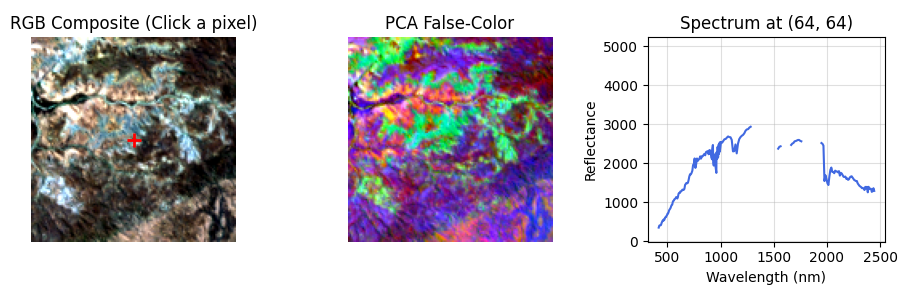

In [ ]:
# Enable the interactive matplotlib backend in your Jupyter Notebook
%matplotlib widget

# Import interactive plotting utility
from helpers.utils import create_interactive_spectral_plot

# Create a new random sample for interactive exploration
idx = random.randint(0, len(dataset) - 1)
real_image = dataset[idx]["image"].float()
wavelengths = load_enmap_wavelengths(ENMAP_BANDS_CSV)[:real_image.shape[0]]
rgb_indices = dataset.rgb_indices["enmap"]

# Create interactive plot. You can modify the figsize to fit your screen
fig = create_interactive_spectral_plot(real_image, wavelengths, rgb_indices, figsize=(9, 3))
plt.show()

In [23]:
%matplotlib inline
plt.ioff()
plt.close('all')  # closes any still-alive widget figures

Let's visualize the temporal dimension of the dataset. Click on the first RGB image to explore temporal spectral changes at different locations. The data exhibits high variance: the spectral signature for the same location varies with acquisition conditions, seasonal effects, and scene changes.

Temporal views can serve as rich data augmentation for joint-embedding SSL methods.

Refresh the cell to get different images!

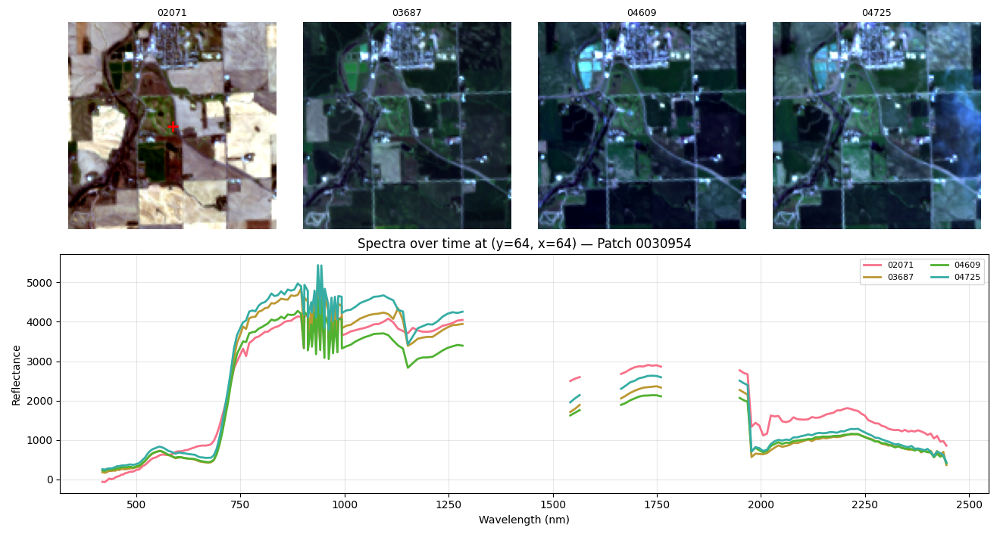

In [ ]:
### Interactive Temporal Analysis


%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
import rasterio
import torch
import random
from helpers.utils import extract_tile_id_from_filename, load_enmap_wavelengths, create_interactive_temporal_plot

# 1) Find candidate patches (those with multiple timestamps/files)
multi_ts_ids = [pid for pid, paths in dataset.patch_paths.items() if len(paths) >= 2]
if not multi_ts_ids:
    raise ValueError("No patches with >= 2 timestamps found in this dataset root.")

ts_patch_id = random.choice(multi_ts_ids)
ts_paths = sorted(dataset.patch_paths[ts_patch_id])  # keep a stable order
tile_ids = [extract_tile_id_from_filename(p) for p in ts_paths]

# 2) Load all timestamps for the chosen patch
ts_images = []
for p in ts_paths:
    with rasterio.open(p) as f:
        arr = f.read()
    ts_images.append(torch.from_numpy(arr).float())

# 3) Prepare wavelengths and RGB indices
C, H, W = ts_images[0].shape
wavelengths = load_enmap_wavelengths(ENMAP_BANDS_CSV)[:C]
rgb_indices = dataset.rgb_indices["enmap"]

# Create interactive temporal plot
fig = create_interactive_temporal_plot(ts_images, tile_ids, wavelengths, rgb_indices, ts_patch_id)
plt.show()

Disable the canvas

In [25]:
%matplotlib inline
plt.ioff()
plt.close('all')  # closes any still-alive widget figures

## 3. Self-Supervised Pre-training with MAE

### What is Masked Autoencoder (MAE)?

Masked Autoencoder is a self-supervised learning approach that:

1. **Randomly masks** a large portion of input patches (typically > 75%)
2. **Encodes** the visible patches using a Vision Transformer
3. **Decodes** the full sequence to reconstruct the original image

### Key Advantages for Hyperspectral Data:

- **No Labels Required**: Learns from unlabeled hyperspectral imagery
- **Spectral Understanding**: Captures spectral-spatial relationships (depending on the backbone)
- **Scalability**: Can leverage large amounts of unlabeled data


### MAE Lightning Module

In [26]:
from typing import Tuple

import numpy as np
import torch
import torch.nn as nn
from lightning import LightningModule
from torch import Tensor
from torch.optim import AdamW, Optimizer
from torch.optim.lr_scheduler import CosineAnnealingLR

import kornia.augmentation as K

from src.transforms.normalize import NormalizeMeanStd

from lightly.models import utils
from lightly.models.modules import MAEDecoderTIMM, MaskedVisionTransformerTIMM
from src.backbones.registry import BACKBONE_REGISTRY

from src.models.mae_module import WrappedVisionTransformer # Only for spec_vit models



###############################################################################
# MAEModule
###############################################################################
class MAEModule(LightningModule):
    """Masked Autoencoder (MAE) module for self-supervised learning on hyperspectral data.

    This module implements MAE adapted for hyperspectral imagery,
    enabling self-supervised pretraining by reconstructing randomly masked patches.
    The implementation is compatible with custom spectral backbone models.
    """

    def __init__(
        self,
        backbone_name: str = "vit_small",
        decoder_dim: int = 512,
        patch_size: int = 128,
        token_patch_size: int = 4,
        in_channels: int = 202,
        mask_ratio: float = 0.75,
        num_layers: int = 1,
        num_heads: int = 16,
        mlp_ratio: int = 4,
        dropout: float = 0.0,
        attention_dropout: float = 0.0,
        lr: float = 0.001,
        T_max: int = 100,
        eta_min: float = 0.0,
        norm_pix: bool = True,
        stats_path: str = "data/statistics",
    ) -> None:
        """Initialize the MAE module for hyperspectral data.

        Args:
            backbone_name: Model name from registry or timm
            decoder_dim: Embedding dimension in decoder
            patch_size: Size of input image patches
            token_patch_size: Size of token patches for ViT
            in_channels: Number of input spectral bands
            mask_ratio: Ratio of tokens to mask
            num_layers: Number of transformer layers in decoder
            num_heads: Number of attention heads in decoder
            mlp_ratio: MLP hidden dim to embedding dim ratio
            dropout: Dropout rate
            attention_dropout: Attention dropout rate
            lr: Learning rate
            T_max: Max iterations for cosine scheduler
            eta_min: Min learning rate for scheduler
            norm_pix: Whether to normalize pixels when computing loss
        """
        super().__init__()
        self.mask_ratio = mask_ratio
        self.lr = lr
        self.T_max = T_max
        self.eta_min = eta_min
        self.norm_pix = norm_pix


        self.mean = torch.tensor(np.load(f'{stats_path}/mu.npy'))
        self.std = torch.tensor(np.load(f'{stats_path}/sigma.npy'))

        # Setup an augmentation pipeline.
        self.augmentations = K.AugmentationSequential(
            K.RandomResizedCrop(size=(patch_size, patch_size), scale=(0.4, 1.0)),
            K.RandomHorizontalFlip(),
            K.RandomVerticalFlip(),
            NormalizeMeanStd(mean=self.mean, std=self.std),
            data_keys=["input"],
        )

        # Feel free to change the backbone to any other model
        vit = BACKBONE_REGISTRY[backbone_name](token_patch_size=token_patch_size)

        if hasattr(vit, "vit_core"):
            vit = WrappedVisionTransformer(vit)

        self.image_size = patch_size
        self.patch_size = token_patch_size

        self.encoder = MaskedVisionTransformerTIMM(vit=vit)

        self.sequence_length = self.encoder.sequence_length

        self.decoder = MAEDecoderTIMM(
            in_chans=in_channels,
            num_patches=vit.patch_embed.num_patches,
            patch_size=token_patch_size,
            decoder_depth=num_layers,
            decoder_num_heads=num_heads,
            embed_dim=vit.embed_dim,
            decoder_embed_dim=decoder_dim,
            mlp_ratio=mlp_ratio,
            proj_drop_rate=dropout,
            attn_drop_rate=attention_dropout,
        )

        self.criterion = nn.MSELoss()


    def forward_encoder(self, images: Tensor, idx_keep: Tensor = None) -> Tensor:
        return self.encoder.encode(images=images, idx_keep=idx_keep)

    def forward_decoder(self, x_encoded, idx_keep, idx_mask):
        # build decoder input
        batch_size = x_encoded.shape[0]
        x_decode = self.decoder.embed(x_encoded)
        x_masked = utils.repeat_token(
            self.decoder.mask_token, (batch_size, self.sequence_length)
        )
        x_masked = utils.set_at_index(x_masked, idx_keep, x_decode.type_as(x_masked))

        # decoder forward pass
        x_decoded = self.decoder.decode(x_masked)

        # predict pixel values for masked tokens
        x_pred = utils.get_at_index(x_decoded, idx_mask)
        x_pred = self.decoder.predict(x_pred)
        return x_pred


    def training_step(self, batch, batch_idx) -> Tensor:
        images = batch["image"].float()
        with torch.no_grad():
            images_aug = self.augmentations(images)
        batch_size = images_aug.shape[0]
        # Create a random token mask.
        idx_keep, idx_mask = utils.random_token_mask(
            size=(batch_size, self.sequence_length),
            mask_ratio=self.mask_ratio,
            device=images.device,
        )
        x_encoded = self.forward_encoder(images=images_aug, idx_keep=idx_keep)
        x_pred = self.forward_decoder(
            x_encoded=x_encoded, idx_keep=idx_keep, idx_mask=idx_mask
        )
        # Get target patches.
        patches = utils.patchify(images_aug, self.patch_size)
        target = utils.get_at_index(patches, idx_mask - 1)
        if self.norm_pix:
            mean_patch = target.mean(dim=-1, keepdim=True)
            var_patch = target.var(dim=-1, keepdim=True)
            target = (target - mean_patch) / (var_patch + 1e-6).sqrt()
        loss = self.criterion(x_pred, target)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self) -> Tuple[list[Optimizer], list]:
        optimizer = AdamW(self.parameters(), lr=self.lr)
        scheduler = CosineAnnealingLR(optimizer, T_max=self.T_max, eta_min=self.eta_min)
        return [optimizer], [scheduler]

### Visualization Callback

A callback that plots training loss and masked image reconstructions. Not very important for understanding.



In [ ]:
# Import MAE visualization utilities from utils
from helpers.utils import denormalize_tensor, create_mae_reconstruction_plot

# MAE Visualization Callback
from lightning import Callback
import torch
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
from lightly.models import utils as L

class MAEVisAndLossCallback(Callback):
    """Callback for MAE training visualization with live loss tracking."""

    def __init__(
        self,
        every_n_steps_images: int = 500,
        loss_every_n_steps: int = 50,
        rgb_indices=(60, 30, 10),
    ) -> None:
        super().__init__()
        self.every_n_steps_images = every_n_steps_images
        self.loss_every_n_steps = loss_every_n_steps
        self.rgb_indices = rgb_indices
        self.steps = []
        self.losses = []
        self._imgs = None

    @torch.no_grad()
    def on_train_batch_end(self, trainer, pl_module, outputs, batch, batch_idx) -> None:
        step = trainer.global_step

        # Record loss
        loss_val = self._extract_loss(outputs, trainer)
        if loss_val is not None:
            self.steps.append(step)
            self.losses.append(loss_val)

        # Update images occasionally
        update_imgs = (self._imgs is None) or (step % self.every_n_steps_images == 0)
        if update_imgs:
            self._imgs = self._generate_reconstruction_images(pl_module, batch)

        # Draw visualization
        should_draw = update_imgs or (step % self.loss_every_n_steps == 0)
        if should_draw:
            self._draw_visualization(pl_module, step)

    def _extract_loss(self, outputs, trainer):
        """Extract loss value from various possible sources."""
        if isinstance(outputs, torch.Tensor):
            return float(outputs.detach().cpu().item())
        elif isinstance(outputs, dict) and "loss" in outputs:
            return float(outputs["loss"].detach().cpu().item())

        # Try from logged metrics
        for key in ("train_loss", "loss", "train_loss_step", "train/loss"):
            if key in trainer.callback_metrics:
                v = trainer.callback_metrics[key]
                try:
                    return float(v.detach().cpu().item() if torch.is_tensor(v) else float(v))
                except Exception:
                    continue
        return None

    def _generate_reconstruction_images(self, pl_module, batch):
        """Generate reconstruction images for visualization."""
        device = pl_module.device
        mean = pl_module.mean.to(device).float()
        std = pl_module.std.to(device).float()
        ps = pl_module.patch_size

        # Prepare input
        img = batch["image"][0:1].to(device).float()  # (1,C,H,W)
        B, C, H, W = img.shape
        img_norm = (img - mean.view(1, -1, 1, 1)) / std.view(1, -1, 1, 1)

        # Generate mask and reconstruct
        L_seq = pl_module.sequence_length
        idx_keep, idx_mask = L.random_token_mask(
            size=(B, L_seq), mask_ratio=pl_module.mask_ratio, device=device
        )

        x_encoded = pl_module.forward_encoder(images=img_norm, idx_keep=idx_keep)
        x_pred = pl_module.forward_decoder(x_encoded=x_encoded, idx_keep=idx_keep, idx_mask=idx_mask)

        # Reconstruct full image
        patches = L.patchify(img_norm, ps)
        if pl_module.norm_pix:
            target_masked = L.get_at_index(patches, idx_mask - 1)
            mean_patch = target_masked.mean(dim=-1, keepdim=True)
            var_patch = target_masked.var(dim=-1, keepdim=True)
            x_pred_denorm = x_pred * (var_patch + 1e-6).sqrt() + mean_patch
        else:
            x_pred_denorm = x_pred

        recon_patches = L.set_at_index(patches, idx_mask - 1, x_pred_denorm)
        recon_norm = L.unpatchify(recon_patches, ps, channels=C)
        recon = denormalize_tensor(recon_norm, mean, std).squeeze(0)
        original = img.squeeze(0)

        # Create masked version for display
        masked = original.clone()
        Wp = W // ps
        for m in (idx_mask[0] - 1).detach().cpu().long().tolist():
            r, c = int(m // Wp), int(m % Wp)
            r0, r1 = r * ps, (r + 1) * ps
            c0, c1 = c * ps, (c + 1) * ps
            masked[:, r0:r1, c0:c1] = 0.0

        return original, masked, recon

    def _draw_visualization(self, pl_module, step):
        """Draw the complete visualization with images and loss."""
        clear_output(wait=True)
        fig = plt.figure(figsize=(14, 4.5), dpi=120)

        # Images
        if self._imgs is not None:
            original, masked, recon = self._imgs
            recon_fig = create_mae_reconstruction_plot(
                original, masked, recon, self.rgb_indices,
                pl_module.mask_ratio, step, figsize=(9, 4)
            )

            # Copy subplots to main figure
            recon_axes = recon_fig.get_axes()
            for i, recon_ax in enumerate(recon_axes):
                ax = fig.add_subplot(1, 4, i+1)
                img = recon_ax.get_images()[0].get_array()
                ax.imshow(img)
                ax.set_title(recon_ax.get_title())
                ax.axis("off")
            plt.close(recon_fig)

        # Loss plot
        ax4 = fig.add_subplot(1, 4, 4)
        if len(self.steps) > 0:
            ax4.plot(self.steps, self.losses)
            ax4.set_title("Training Loss")
            ax4.set_xlabel("Step")
            ax4.set_ylabel("MSE")
            ax4.grid(True, alpha=0.3)
        else:
            ax4.text(0.5, 0.5, "No loss data yet", ha="center", va="center")
            ax4.axis("off")

        fig.suptitle("MAE Training Progress", y=1.02)
        plt.tight_layout()
        display(fig)
        plt.close(fig)

Instantiate the MAE module

In [28]:
# Model configuration
BACKBONE_NAME = "spec_vit_tiny"  # Options: "vit_tiny", "vit_small", "vit_base"
TOKEN_PATCH_SIZE = 4

In [29]:
mae_model = MAEModule(
            backbone_name=BACKBONE_NAME,
            patch_size=128,
            token_patch_size=TOKEN_PATCH_SIZE,
            in_channels=202,
            mask_ratio=0.85,
            lr=1e-5, # play with the learning rate for faster convergence
            T_max=10,
        )

### Data Module Setup

Let's create a data module that uses the correct data paths for the Spectral Earth dataset.


In [30]:
# Create the Spectral Earth Data Module
data_module = SpectralEarthDataModule(
    root=SPECTRAL_EARTH_DATA,
    batch_size=32,
    num_workers=4,
    pin_memory=True,
)

### MAE Training

Let's visualize how MAE reconstructs masked patches to understand the learning process.


Optionally, after trying to train your own MAE model, download a checkpoint that has been pre-trained on SpectralEarth for many epochs. You should observe the difference in the reconstructions quality.

The **ViT-Tiny** and **Spec. ViT-Tiny** with patch size **4x4** are available.

In [32]:
from pathlib import Path
from huggingface_hub import hf_hub_download

REPO = "aabnassim/spectral-earth-checkpoints"

mae_vit_tiny_ckpt = Path(hf_hub_download(repo_id=REPO, filename="mae_checkpoints/mae_vit_tiny.ckpt", cache_dir="pretrained_models"))
mae_spec_vit_tiny_ckpt = Path(hf_hub_download(repo_id=REPO, filename="mae_checkpoints/mae_spec_vit_tiny.ckpt", cache_dir="pretrained_models"))

print(mae_vit_tiny_ckpt)
print(mae_spec_vit_tiny_ckpt)


mae_vit_tiny.ckpt:   0%|          | 0.00/134M [00:00<?, ?B/s]

mae_spec_vit_tiny.ckpt:   0%|          | 0.00/132M [00:00<?, ?B/s]

pretrained_models/models--aabnassim--spectral-earth-checkpoints/snapshots/3518899fc72a4da10f27d9262be280771fef511a/mae_checkpoints/mae_vit_tiny.ckpt
pretrained_models/models--aabnassim--spectral-earth-checkpoints/snapshots/3518899fc72a4da10f27d9262be280771fef511a/mae_checkpoints/mae_spec_vit_tiny.ckpt


Helper function to get how many epochs the MAE ckpt was trained for

In [31]:
def epochs_done_from_ckpt(ckpt_path):
    import math
    from pathlib import Path
    if ckpt_path in (None, "") or (isinstance(ckpt_path, float) and math.isnan(ckpt_path)):
        return 0
    p = Path(str(ckpt_path))
    if not p.exists():
        return 0
    try:
        import torch
        e = torch.load(p, map_location="cpu").get("epoch", None)
        return int(e) + 1 if isinstance(e, (int, float)) else 0
    except Exception:
        return 0


Create the MAE Lightning Module + Visualization Callback, and train from scratch or continue pre-training

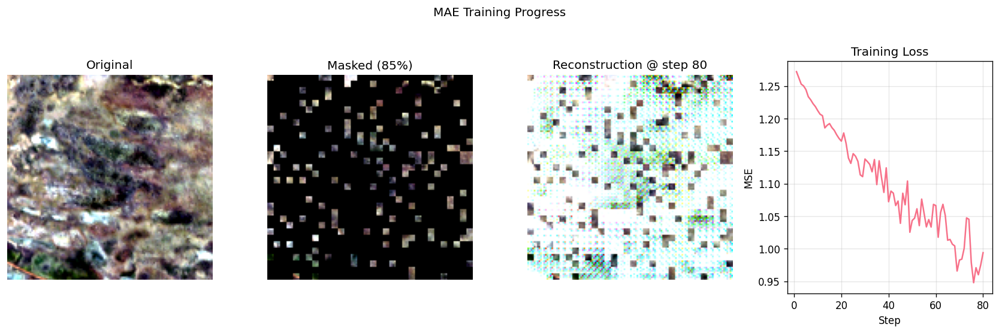

INFO: 
Detected KeyboardInterrupt, attempting graceful shutdown ...
INFO:lightning.pytorch.utilities.rank_zero:
Detected KeyboardInterrupt, attempting graceful shutdown ...
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 598, in _fit_impl
    self._run(model, ckpt_path=ckpt_path)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1055, in _run_stage
    self.fit_loop.run()
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/loops/fit_loop.py", line 216, in run
    self.advance()
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/loops/fit_loop.py", line 458, in advance
    self.epoch_loop.run(self._data_fetcher)
  File "/usr/local/lib/python3.12

TypeError: object of type 'NoneType' has no len()

In [22]:
from lightning import Trainer

# USAGE (use this instead of the separate image callback to avoid Jupyter flicker):
vis_loss_cb = MAEVisAndLossCallback(
     every_n_steps_images=20,
     loss_every_n_steps=20,
     rgb_indices=(43, 28, 10),
)


ckpt_path = None # Set to None to train from scratch, or a path to a checkpoint to resume training
max_epochs = epochs_done_from_ckpt(ckpt_path) + 10

print(f"Training for {max_epochs} epochs")

trainer = Trainer(callbacks=[vis_loss_cb], max_epochs=max_epochs, precision="16-mixed", accelerator="auto")
trainer.fit(mae_model, datamodule=data_module, ckpt_path=ckpt_path)

### Extract the backbone

You can extract the pre-trained model from the MAE lightning module and save it for later use in the downstream task

In [33]:
# Extract the backbone from the trained MAE model
import torch
from pathlib import Path
backbone_filename = f"{BACKBONE_NAME}_patch_{TOKEN_PATCH_SIZE}_mae.pth"

# Create the backbone save directory
backbone_save_dir = Path("pretrained_models")
backbone_save_dir.mkdir(exist_ok=True)
backbone_save_path = backbone_save_dir / backbone_filename

# Extract the backbone (encoder) from the MAE model
backbone_state_dict = mae_model.encoder.vit.state_dict()
torch.save(backbone_state_dict, backbone_save_path)

print(f"✅ Backbone extracted and saved!")
print(f"📁 Saved to: {backbone_save_path}")
print(f"🔧 Backbone: {BACKBONE_NAME}")
print(f"💾 Model size: {backbone_save_path.stat().st_size / (1024*1024):.2f} MB")


✅ Backbone extracted and saved!
📁 Saved to: pretrained_models/spec_vit_tiny_patch_4_mae.pth
🔧 Backbone: spec_vit_tiny
💾 Model size: 23.71 MB


In [34]:
# Clear the plots
clear_output()

## 4. Downstream Tasks


### Downstream Tasks Overview

The Spectral Earth framework supports various downstream tasks for hyperspectral imagery:

1. **Crop Type Classification** (EnMAP-CDL, EnMAP-EuroCrops)
2. **Land Cover Segmentation** (EnMAP-NLCD, EnMAP-CORINE)
3. **Tree Species Classification** (EnMAP-BDForet, EnMAP-TreeMap)





![Alt text or caption](spectral_earth/downstream_tasks_overview.png)

### Visualize the EuroCrops Dataset

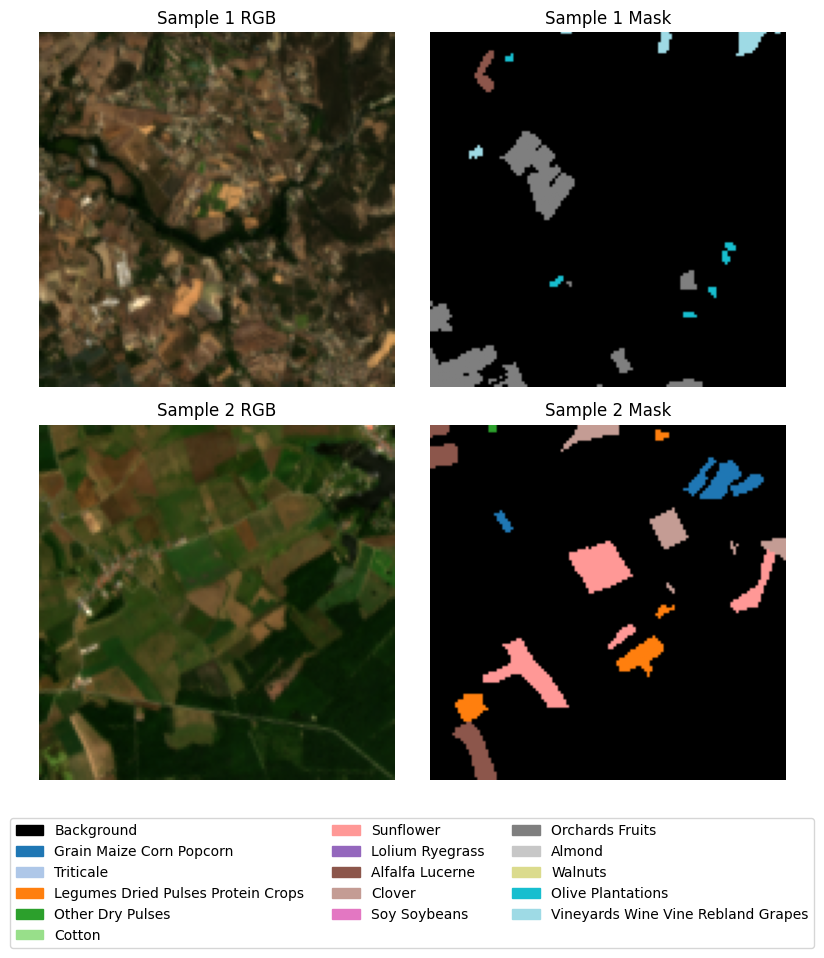

In [ ]:
# Import dataset visualization utilities
from helpers.utils import create_class_colormap_and_legend, plot_classification_sample
from src.datasets.enmap_eurocrops import EnMAPEurocropsDataset
import pandas as pd
import random
import os

# Dataset configuration - using the configured path
MAPPING_CSV = "HCAT3.csv"
ALLOWED_CLASSES = {
    0, 3301090205, 3301010600, 3301090303, 3301010800, 3301090301,
    3303060000, 3303030600, 3303050000, 3303030100, 3301060500,
    3301060300, 3303010000, 3301020000, 3301160000, 3301029900
}

# Create dataset
classes_for_loader = sorted(ALLOWED_CLASSES)
ds_viz = EnMAPEurocropsDataset(
    root=EUROCROPS_DATA, sensor="enmap", split="train",
    classes=classes_for_loader, raw_mask=True
)

# Load class mapping
df = pd.read_csv(os.path.join(EUROCROPS_DATA, MAPPING_CSV))
df["HCAT3_code"] = df["HCAT3_code"].astype(int)
class_mapping = {int(k): str(v).replace("_", " ").title()
                for k, v in zip(df["HCAT3_code"], df["HCAT3_name"])}
class_mapping[0] = "Background"

# Create colormap and legend
legend, color_map = create_class_colormap_and_legend(ALLOWED_CLASSES, class_mapping)
rgb_indices = ds_viz.rgb_indices[ds_viz.sensor]

# Plot sample images
num_samples = 2
random.seed(0)
indices = random.sample(range(len(ds_viz)), k=min(num_samples, len(ds_viz)))

fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4 * num_samples))
if num_samples == 1:
    axes = np.expand_dims(axes, 0)

for r, idx in enumerate(indices):
    sample = ds_viz[idx]
    sample_fig = plot_classification_sample(
        sample, rgb_indices, color_map, ALLOWED_CLASSES,
        title_prefix=f"Sample {r+1}"
    )

    # Extract subplots from sample figure to main figure
    sample_axes = sample_fig.get_axes()
    for i, sample_ax in enumerate(sample_axes):
        img = sample_ax.get_images()[0].get_array()
        axes[r, i].imshow(img)
        axes[r, i].set_title(sample_ax.get_title())
        axes[r, i].axis("off")
    plt.close(sample_fig)

# Add legend
import matplotlib.patches as mpatches
labels = [name for _, name, _ in legend]
patches = [mpatches.Patch(color=color, label=name) for _, name, color in legend]

fig.legend(
    handles=patches, labels=labels, loc="lower center",
    ncol=min(3, len(patches)), bbox_to_anchor=(0.5, -0.2)
)

plt.tight_layout()
plt.show()

Optional: copy the EnMAP-EuroCrops dataset to RAM to speed up data loading during training (uses ~5 GB RAM).

In [ ]:
!cp -r data/enmap_eurocrops/ /dev/shm

### Transfer Learning with Pre-trained Models

After pre-training with MAE, we can use the learned representations for downstream tasks. Let's explore semantic segmentation as an example.

First, download pre-trained models from Spectral Earth. Those backbones have a token patch size of 4. We recommend sticking to the small models

In [36]:
from pathlib import Path
from huggingface_hub import hf_hub_download

REPO = "aabnassim/spectral-earth-checkpoints"

ALIASES = {
    "spec_vit_small":"spec_vit_s", "spec_vit_s":"spec_vit_s",
    "spec_vit_base":"spec_vit_b",  "spec_vit_b":"spec_vit_b",
    "spec_vit_large":"spec_vit_l", "spec_vit_l":"spec_vit_l",
    "spec_resnet50":"spec_rn50",
}

VALID = {
    ("spec_vit_small","mae"), ("spec_vit_small","dino"), ("spec_vit_small","moco"),
    ("spec_vit_base","mae"),
    ("spec_vit_large","mae"),
    ("spec_resnet50","dino"), ("spec_resnet50","moco"),
}

def get_checkpoint(backbone, algo, revision=None, cache_dir=None) -> Path:
    key = (backbone.lower(), algo.lower())
    if key not in VALID:
        raise KeyError(f"No weights registered for {key}.")
    bb = ALIASES[backbone.lower()]
    filename = f"{bb}/{algo.lower()}.pth"
    return Path(hf_hub_download(repo_id=REPO, filename=filename, revision=revision, cache_dir=cache_dir))

Pick a backbone

In [37]:
BACKBONE_NAME = "spec_vit_small"

In [38]:
ckpt_path = get_checkpoint(BACKBONE_NAME, "mae", cache_dir="pretrained_models")   # -> local cached path

mae.pth:   0%|          | 0.00/90.2M [00:00<?, ?B/s]

In [27]:
ckpt_path  # Inspect the resolved checkpoint path

PosixPath('pretrained_models/models--aabnassim--spectral-earth-checkpoints/snapshots/3518899fc72a4da10f27d9262be280771fef511a/spec_vit_s/mae.pth')

Create the segmentation lightning module with the pre-trained weights: : None for training from scratch, backbone_save_path for the model trained in the notebok,ckpt_path for models pre-trained on the full SpectralEarth dataset

In [29]:

seg_model = SemanticSegmentationModule(
    seg_model="conv_head",      # Decoder architecture
    backbone=BACKBONE_NAME, # Backbone model
    num_classes=len(ALLOWED_CLASSES) - 1,   # Number of classes
    ignore_index=len(ALLOWED_CLASSES) - 1,  # Background class
    in_channels=202,
    img_size=128,
    pretrained_weights=ckpt_path,   # Pre-trained weights path
    token_patch_size=4,        # You can play with this parameter
    freeze_backbone=True,  # Freeze the backbone weights
    learning_rate=1e-4,
    weight_decay=1e-4,
    t_max=5
)


print(f"Segmentation Model created successfully!")
print(f"Model parameters: {sum(p.numel() for p in seg_model.parameters()):,}")



Encoder weights loaded: <All keys matched successfully>
Segmentation Model created successfully!
Model parameters: 22,991,375


Visualize the encoder - decoder segmentation architecture

In [30]:
net = seg_model.model.eval()
print(net)

ViTSegmentor(
  (encoder): SpecViTSmall(
    (spectral_adapter): SpectralAdapter(
      (0): Conv3d(1, 32, kernel_size=(7, 1, 1), stride=(5, 1, 1), padding=(1, 0, 0))
      (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv3d(32, 64, kernel_size=(7, 1, 1), stride=(5, 1, 1), padding=(1, 0, 0))
      (4): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): Conv3d(64, 128, kernel_size=(5, 1, 1), stride=(3, 1, 1), padding=(1, 0, 0))
      (7): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU()
      (9): AdaptiveAvgPool3d(output_size=(1, None, None))
    )
    (vit_core): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(128, 384, kernel_size=(4, 4), stride=(4, 4))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): 

Create the data module for the eurocrops downstream task

In [31]:
from src.datamodules.enmap_eurocrops import EnMAPEurocropsDataModule

dm = EnMAPEurocropsDataModule(
    root=EUROCROPS_DATA if not os.path.exists("/dev/shm/enmap_eurocrops") else "/dev/shm/enmap_eurocrops",
    classes=ALLOWED_CLASSES,
    sensor="enmap",
    num_bands=202,
    batch_size=16,
    num_workers=2,
    patch_size=128
)


Import the visualization callback (loss + validation samples)

In [ ]:
from helpers.training_callbacks import SegmentationTrainingMonitor

Run training on the downstream task for 5 epochs (to reduce the compute time)

In [33]:
from lightning.pytorch import Trainer, seed_everything

seed_everything(42)

# Create the clean training monitor callback
training_monitor = SegmentationTrainingMonitor(
    plot_every_n_epochs=1,
    n_preview_samples=2,
    show_sanity_check=False,
    figsize=(15, 5)
)

# We train for 5 epochs
trainer = Trainer(
    max_epochs=5,
    logger=False,
    callbacks=[training_monitor],
    devices=1,
    accelerator="auto",
    precision="16-mixed"
)

trainer.fit(seg_model, datamodule=dm)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: Using 16bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilitie

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO: 
Detected KeyboardInterrupt, attempting graceful shutdown ...
INFO:lightning.pytorch.utilities.rank_zero:
Detected KeyboardInterrupt, attempting graceful shutdown ...
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 598, in _fit_impl
    self._run(model, ckpt_path=ckpt_path)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1055, in _run_stage
    self.fit_loop.run()
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/loops/fit_loop.py", line 216, in run
    self.advance()
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/loops/fit_loop.py", line 458, in advance
    self.epoch_loop.run(self._data_fetcher)
  File "/usr/local/lib/python3.12

TypeError: object of type 'NoneType' has no len()

## 5. Visualizing Learned Representations

Before diving into exercises, let's explore how to visualize and interpret the representations learned by our self-supervised models. This is crucial for understanding what features the model has captured.

### t-SNE Embedding Visualization

We'll use a pre-trained DINO model to extract embeddings from our hyperspectral data and visualize them using t-SNE dimensionality reduction.


In [ ]:
# Load pre-trained model and extract embeddings
from spectral_earth.src.backbones.spec_vit import SpecViTSmall # You can try other backbones
from helpers.utils import extract_embeddings_from_model, create_tsne_visualization
from torch.utils.data import DataLoader, Subset
import random

print("🔧 Setting up pre-trained DINO model for embedding extraction...")

# Initialize DINO model with spectral ViT backbone
dino_model = SpecViTSmall()
# Load the pre-trained weights
ckpt_path = get_checkpoint("spec_vit_small", "dino", cache_dir="pretrained_models")   # -> local cached path
dino_model.load_state_dict(torch.load(ckpt_path), strict=False)

# Create subset for visualization (manageable size)
n_samples = 250
subset_indices = random.sample(range(len(dataset)), min(n_samples, len(dataset)))
subset_dataset = Subset(dataset, subset_indices)

vis_dataloader = DataLoader(
    subset_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=4
)

print(f"📊 Extracting embeddings from {len(subset_dataset)} samples...")

# Extract embeddings using utility function
embeddings, sample_images = extract_embeddings_from_model(
    model=dino_model,
    dataloader=vis_dataloader,
    device="cuda",  # Change to "cuda" if GPU available
    max_samples=n_samples
)

print(f"✅ Extracted embeddings shape: {embeddings.shape}")


🔧 Setting up pre-trained DINO model for embedding extraction...


dino.pth:   0%|          | 0.00/90.2M [00:00<?, ?B/s]

📊 Extracting embeddings from 250 samples...
  Processed 32 samples...
✅ Extracted embeddings shape: (250, 1000)


In [40]:
# Create cluster-based t-SNE visualization
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

print("🔬 Creating cluster-based t-SNE analysis...")

# Step 1: Apply PCA for efficiency
print("  Step 1: PCA preprocessing...")
pca = PCA(n_components=50, random_state=42)
embeddings_pca = pca.fit_transform(embeddings)
print(f"  PCA explained variance: {pca.explained_variance_ratio_.sum():.3f}")

# Step 2: Apply t-SNE
print("  Step 2: t-SNE embedding...")
tsne = TSNE(n_components=2, perplexity=20, random_state=42, verbose=0)
embeddings_2d = tsne.fit_transform(embeddings_pca)

# Step 3: Cluster the embeddings
print("  Step 3: Discovering clusters...")
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(embeddings_2d)

# Step 4: Find representative samples from each cluster
print("  Step 4: Finding representative samples...")
cluster_representatives = {}
cluster_centers_2d = kmeans.cluster_centers_

for cluster_id in range(n_clusters):
    # Find samples in this cluster
    cluster_mask = cluster_labels == cluster_id
    cluster_points = embeddings_2d[cluster_mask]
    cluster_indices = np.where(cluster_mask)[0]

    if len(cluster_points) > 0:
        # Find the sample closest to cluster center
        center = cluster_centers_2d[cluster_id]
        distances = np.linalg.norm(cluster_points - center, axis=1)
        closest_idx = np.argmin(distances)
        representative_idx = cluster_indices[closest_idx]

        cluster_representatives[cluster_id] = {
            'index': representative_idx,
            'size': len(cluster_points),
            'center': center,
            'percentage': len(cluster_points) / len(embeddings_2d) * 100
        }

print(f"✅ Discovered {n_clusters} clusters with sizes: {[info['size'] for info in cluster_representatives.values()]}")


🔬 Creating cluster-based t-SNE analysis...
  Step 1: PCA preprocessing...
  PCA explained variance: 0.999
  Step 2: t-SNE embedding...
  Step 3: Discovering clusters...
  Step 4: Finding representative samples...
✅ Discovered 10 clusters with sizes: [35, 24, 27, 24, 21, 24, 28, 21, 21, 25]


🎨 Creating cluster visualization with subset selection...
  Randomly selected 5 clusters: [5, 9, 0, 2, 7]
  Finding 5 samples from 5 clusters...
  Displaying 5 samples from 5 selected clusters...


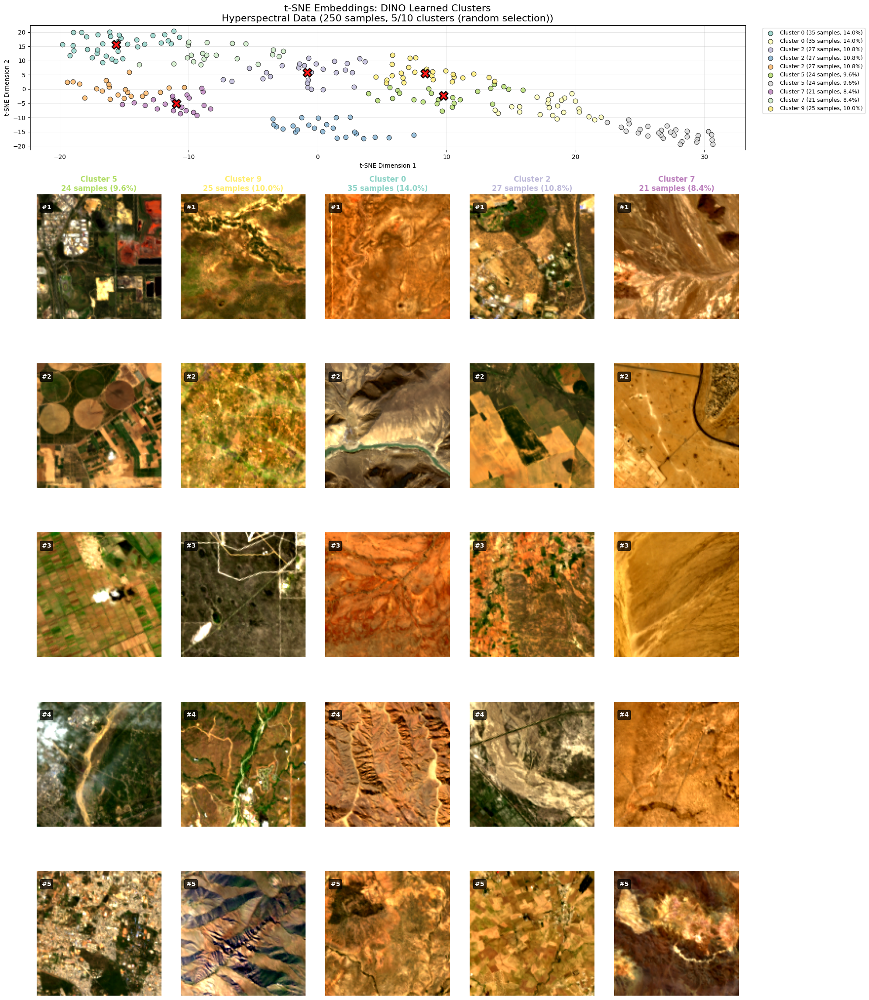

In [41]:
# Create comprehensive cluster visualization with subset selection
print("🎨 Creating cluster visualization with subset selection...")

# Parameters - CONFIGURABLE
samples_per_cluster = 5  # Number of samples to show per cluster
clusters_to_show = None
max_clusters_to_display = 5  # Maximum clusters to show in auto-mode

# Determine which clusters to visualize
if clusters_to_show is None:
    # Auto-select clusters randomly (for exploration)
    available_clusters = list(range(n_clusters))
    for cluster_id in range(n_clusters):
        cluster_mask = cluster_labels == cluster_id

    # Randomly select clusters for variety
    np.random.shuffle(available_clusters)
    selected_clusters = available_clusters[:max_clusters_to_display]

    print(f"  Randomly selected {len(selected_clusters)} clusters: {selected_clusters}")
else:
    # Use user-specified clusters
    selected_clusters = [c for c in clusters_to_show if c < n_clusters]
    print(f"  User-selected clusters: {selected_clusters}")

n_display_clusters = len(selected_clusters)

# Find multiple representative samples from selected clusters
print(f"  Finding {samples_per_cluster} samples from {n_display_clusters} clusters...")
cluster_samples = {}

for cluster_id in selected_clusters:
    cluster_mask = cluster_labels == cluster_id
    cluster_points = embeddings_2d[cluster_mask]
    cluster_indices = np.where(cluster_mask)[0]

    if len(cluster_points) > 0:
        center = cluster_centers_2d[cluster_id]
        distances = np.linalg.norm(cluster_points - center, axis=1)

        # Get multiple samples: closest, some diverse ones
        n_samples = min(samples_per_cluster, len(cluster_points))

        if n_samples == 1:
            selected_indices = [np.argmin(distances)]
        else:
            # Get closest sample
            closest_idx = np.argmin(distances)
            selected_local = [closest_idx]

            # Get some diverse samples (spread across the cluster)
            remaining_indices = list(range(len(cluster_points)))
            remaining_indices.remove(closest_idx)

            # Sort remaining by distance and pick evenly spread samples
            remaining_distances = distances[remaining_indices]
            sorted_remaining = np.argsort(remaining_distances)

            # Select samples spread across the distance range
            step = max(1, len(sorted_remaining) // (n_samples - 1))
            for j in range(n_samples - 1):
                if j * step < len(sorted_remaining):
                    selected_local.append(remaining_indices[sorted_remaining[j * step]])

        # Convert to global indices
        selected_global = [cluster_indices[idx] for idx in selected_local]

        cluster_samples[cluster_id] = {
            'indices': selected_global[:n_samples],
            'size': len(cluster_points),
            'center': center,
            'percentage': len(cluster_points) / len(embeddings_2d) * 100
        }

# Create the visualization
fig = plt.figure(figsize=(4 * n_display_clusters, 8 + 3 * samples_per_cluster))

# Main t-SNE plot with all clusters (but highlight selected ones)
ax_main = plt.subplot2grid((1 + samples_per_cluster, n_display_clusters), (0, 0),
                          colspan=n_display_clusters, rowspan=1)

# Color palette for all clusters
colors = plt.cm.Set3(np.linspace(0, 1, n_clusters))

# Plot all clusters (with different alpha for non-selected)
for cluster_id in range(n_clusters):
    cluster_mask = cluster_labels == cluster_id
    cluster_size = np.sum(cluster_mask)
    cluster_pct = cluster_size / len(embeddings_2d) * 100

    # Different style for selected vs non-selected clusters
    if cluster_id in selected_clusters:
        alpha, size, label = 0.8, 60, f'Cluster {cluster_id} ({cluster_size} samples, {cluster_pct:.1f}%)'
        edgecolor, linewidth = 'black', 0.8


    scatter = ax_main.scatter(
        embeddings_2d[cluster_mask, 0],
        embeddings_2d[cluster_mask, 1],
        c=[colors[cluster_id]],
        label=label,
        alpha=alpha,
        s=size,
        edgecolors=edgecolor,
        linewidths=linewidth
    )

    # Mark cluster centers (only for selected clusters)
    if cluster_id in selected_clusters:
        center = cluster_centers_2d[cluster_id]
        ax_main.scatter(center[0], center[1], c='red', s=200, marker='X',
                       edgecolors='black', linewidths=2, alpha=0.9, zorder=10)

if n_display_clusters == n_clusters:
    title_suffix = f"All {n_clusters} clusters"
else:
    title_suffix = f"{n_display_clusters}/{n_clusters} clusters (random selection)"

ax_main.set_title(f"t-SNE Embeddings: DINO Learned Clusters\n" +
                 f"Hyperspectral Data ({len(embeddings_2d)} samples, {title_suffix})",
                 fontsize=16)
ax_main.set_xlabel("t-SNE Dimension 1")
ax_main.set_ylabel("t-SNE Dimension 2")
ax_main.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
ax_main.grid(True, alpha=0.3)

# Show multiple samples from selected clusters only
print(f"  Displaying {samples_per_cluster} samples from {n_display_clusters} selected clusters...")

for sample_row in range(samples_per_cluster):
    for col_idx, cluster_id in enumerate(selected_clusters):
        ax_img = plt.subplot2grid((1 + samples_per_cluster, n_display_clusters),
                                (1 + sample_row, col_idx))

        # Get the sample for this row
        if cluster_id in cluster_samples:
            sample_indices = cluster_samples[cluster_id]['indices']

            if sample_row < len(sample_indices):
                sample_idx = sample_indices[sample_row]

                # Get the corresponding image
                if sample_idx < len(sample_images):
                    sample_image = sample_images[sample_idx]
                else:
                    sample_image = sample_images[0]  # Fallback

                # Create RGB composite
                if len(sample_image.shape) == 3:  # (C, H, W)
                    rgb_image = sample_image[list(rgb_indices)].numpy().transpose(1, 2, 0)
                else:
                    rgb_image = sample_image.numpy()

                # Apply percentile scaling
                p2, p98 = np.percentile(rgb_image, [2, 98])
                rgb_image = np.clip((rgb_image - p2) / (p98 - p2 + 1e-8), 0, 1)

                ax_img.imshow(rgb_image)

                # Add title only to the first row
                if sample_row == 0:
                    cluster_size = cluster_samples[cluster_id]['size']
                    cluster_pct = cluster_samples[cluster_id]['percentage']
                    ax_img.set_title(f'Cluster {cluster_id}\n{cluster_size} samples ({cluster_pct:.1f}%)',
                                    fontsize=12, color=colors[cluster_id], weight='bold')

                # Add sample number as text overlay
                ax_img.text(5, 15, f'#{sample_row + 1}', color='white', fontweight='bold',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.7))
            else:
                # Empty subplot if no more samples
                ax_img.text(0.5, 0.5, 'No more\nsamples', ha='center', va='center',
                           transform=ax_img.transAxes, fontsize=10, alpha=0.5)

        ax_img.axis("off")

plt.tight_layout()
plt.show()


## 6. Exercises

Now that you've learned the fundamentals, try these hands-on exercises to deepen your understanding:



### 🎯 Exercise 1: MAE Hyperparameter Exploration

**Goal**: Understand how different MAE parameters affect reconstruction quality.

**Tasks**:
1. Train MAE models with different mask ratios (0.75, 0.85, 0.9)
2. Compare reconstruction quality visually
3. Experiment with different patch sizes (4, 8, 16)

**Questions to explore**:
- How does mask ratio affect the reconstruction quality?
- How do larger patch sizes affect spectral detail preservation?
- Which configurations works best on the downstream task?




### 🎯 Exercise 2: Backbone Architecture and Transfer Learning Strategies

**Goal**: Experiment with different model architectures and transfer learning approaches for downstream tasks.

**Tasks**:
1. **Compare backbones**: Test ViT-tiny, ViT-small and their variants with 1D Conv (Spec. ViT) with/without pre-training
2. **Freezing strategies**: Compare frozen backbone vs full fine-tuning
3. **Training from scratch**: Compare pre-trained models against randomly initialized ones
4. **Analyze trade-offs**: Performance vs training time vs data requirements

**Key Questions**:
- Which backbone size works best for your data/compute budget?
- When should you freeze vs fine-tune the backbone?
- How much does pre-training help vs training from scratch?


-------------------------------------------------------------------

### 🎯 Exercise 3: PCA vs Raw Bands for Self-Supervised Learning (Advanced)

**Goal**: Compare PCA dimensionality reduction against raw 202 bands for MAE pre-training and downstream tasks.

**Tasks**:
1. **Implement PCA pipeline**: Create PCA transform with 8, 16, 32 components
2. **Train MAE models**: Pre-train on PCA-reduced vs raw bands
3. **Compare downstream performance**: Fine-tune on crop classification
4. **Analyze results**: Plot explained variance and training curves

**Key Questions**:
- How much spectral information is preserved with fewer components?
- Does PCA improve training efficiency vs accuracy trade-offs?

### 🎯 Exercise 4: Alternative Self-Supervised Learning Methods (Advanced)

**Goal**: Implement and compare other SSL methods (SimSiam, BYOL, or Barlow Twins) with MAE on hyperspectral data.

**Tasks**:
1. **Choose an SSL method**: Pick SimSiam, BYOL, or Barlow Twins from [Lightly documentation](https://docs.lightly.ai/self-supervised-learning/examples/models.html)
2. **Adapt for hyperspectral data**: Modify input channels from 3 (RGB) to 202 (hyperspectral)
3. **Monitor training**: Track loss curves and watch for representation collapse

**Key Questions**:
- How do contrastive methods compare to reconstruction-based MAE?
- Do you observe representation collapse? How can you detect/prevent it?


